# Examining TEMPO data retrieved from NASA Earthdata

## Overview

This notebook retrieves TEMPO data and inspects the characteristics of the data.

## Dataset Information

This notebook uses data from the [Tropospheric Emissions: Monitoring of Pollution (TEMPO)](https://asdc.larc.nasa.gov/project/TEMPO) instrument.

## Table of Contents

1. Setup
2. Search for data granules
3. Examining and downloading file results
4. Reading and inspecting the data
5. Working with the data to subset and plot
6. Using Harmony-py to pre-process and retrieve data
7. Plotting the data

# 1. Setup

In [1]:
!pip install -qq harmony-py python-cmr wget cartopy earthaccess netCDF4 matplotlib xarray numpy

In [2]:
# Load packages into current runtime
import earthaccess # needed to discover and download TEMPO data
import netCDF4 as nc # needed to read TEMPO data

import os
import sys

import platform
from subprocess import Popen
import shutil

import numpy as np
#import numpy.ma as ma

import matplotlib.pyplot as plt # needed to plot the resulting time series
from matplotlib.pyplot import cm
import matplotlib.ticker as mticker
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER
import datetime as dt

import getpass
import traceback
from typing import Dict

import xarray as xr

import cmr
from harmony import BBox, Client, Collection, Request
from harmony.config import Environment

## Logging in and creating local directory

In [ ]:
# User needs to create an account at https://www.earthdata.nasa.gov/
# Function earthaccess.login prompts for EarthData login and password.
auth = earthaccess.login(strategy="interactive", persist=True)

# Creating local directory
homeDir = os.path.expanduser("~") + os.sep

with open(homeDir + '.dodsrc', 'w') as file:
    file.write('HTTP.COOKIEJAR={}.urs_cookies\n'.format(homeDir))
    file.write('HTTP.NETRC={}.netrc'.format(homeDir))
    file.close()

print('Saved .dodsrc to:', homeDir)

# Set appropriate permissions for Linux/macOS
if platform.system() != "Windows":
    Popen('chmod og-rw ~/.netrc', shell=True)
else:
    # Copy dodsrc to working directory in Windows
    shutil.copy2(homeDir + '.dodsrc', os.getcwd())
    print('Copied .dodsrc to:', os.getcwd())

# 2. Search for TEMPO granules

We are going to search for data about nitrogen dioxide ($NO_2$) concentrations from TEMPO.

In [4]:
! rm *.nc*

In [5]:
short_name = 'TEMPO_NO2_L3' # collection name to search for in the EarthData
version = 'V03'

auth = earthaccess.login()

# Point of interest: NASA Langley Research Center, HamptonVA, USA
# latitude 37.1036 deg, longitude -76.3868 deg
#POI_lat = 37.1036
#POI_lon = -76.3868

# generic location, somewhere in the middle of the USA
POI_lat = 38.
POI_lon = -96.
date_start = '2024-09-01 00:00:00'
date_end = '2024-09-01 23:59:59'

POI_results = earthaccess.search_data(short_name = short_name\
                                    , version = version\
                                    , temporal = (date_start, date_end)\
                                    , point = (POI_lon, POI_lat)) # search by point of interest

dlat = 5. # deg
dlon = 6. # deg
bbox_results = earthaccess.search_data(short_name = short_name\
                                     , version = version\
                                     , temporal = (date_start, date_end)\
                                     , bounding_box = (POI_lon - dlon, POI_lat - dlat, POI_lon + dlon, POI_lat + dlat)) # search by bounding box

# 3. Examining and downloading file results

## What does a result look like?

In [6]:
POI_results[0]

Collection: {'ShortName': 'TEMPO_NO2_L3', 'Version': 'V03'}
Spatial coverage: {'HorizontalSpatialDomain': {'Geometry': {'GPolygons': [{'Boundary': {'Points': [{'Latitude': 57.02, 'Longitude': -163.84}, {'Latitude': 56.94, 'Longitude': -163.72}, {'Latitude': 56.1, 'Longitude': -158.9}, {'Latitude': 55.08, 'Longitude': -154.7}, {'Latitude': 53.88, 'Longitude': -150.84}, {'Latitude': 52.4, 'Longitude': -147.02}, {'Latitude': 50.66, 'Longitude': -143.38}, {'Latitude': 48.7, 'Longitude': -140.02}, {'Latitude': 46.62, 'Longitude': -137.06}, {'Latitude': 44.1, 'Longitude': -134.08}, {'Latitude': 41.38, 'Longitude': -131.42}, {'Latitude': 38.42, 'Longitude': -129.02}, {'Latitude': 35.62, 'Longitude': -127.12}, {'Latitude': 32.42, 'Longitude': -125.3}, {'Latitude': 29.02, 'Longitude': -123.7}, {'Latitude': 25.44, 'Longitude': -122.32}, {'Latitude': 21.64, 'Longitude': -121.14}, {'Latitude': 17.56, 'Longitude': -120.14}, {'Latitude': 17.26, 'Longitude': -102.38}, {'Latitude': 17.22, 'Longitude': -83.74001}, {'Latitude': 29.44, 'Longitude': -82.82}, {'Latitude': 34.42, 'Longitude': -82.28}, {'Latitude': 40.04, 'Longitude': -81.5}, {'Latitude': 48.12, 'Longitude': -79.92}, {'Latitude': 52.84, 'Longitude': -78.62}, {'Latitude': 57.3, 'Longitude': -77}, {'Latitude': 57.92, 'Longitude': -77}, {'Latitude': 57.76, 'Longitude': -81.08}, {'Latitude': 57.64, 'Longitude': -86.98}, {'Latitude': 57.68, 'Longitude': -96.62}, {'Latitude': 58, 'Longitude': -106.2}, {'Latitude': 58.56, 'Longitude': -115.46}, {'Latitude': 59.48, 'Longitude': -126.08}, {'Latitude': 60.6, 'Longitude': -136.36}, {'Latitude': 62.08, 'Longitude': -147.78}, {'Latitude': 63.76, 'Longitude': -159.66}, {'Latitude': 63.6, 'Longitude': -159.68}, {'Latitude': 63.76, 'Longitude': -160.82}, {'Latitude': 62.04, 'Longitude': -160.96}, {'Latitude': 62.06, 'Longitude': -161.12}, {'Latitude': 61.96, 'Longitude': -161.14}, {'Latitude': 61.98, 'Longitude': -161.36}, {'Latitude': 61.88, 'Longitude': -161.38}, {'Latitude': 61.94, 'Longitude': -161.84}, {'Latitude': 60.58, 'Longitude': -162.06}, {'Latitude': 60.66, 'Longitude': -162.78}, {'Latitude': 59.58, 'Longitude': -162.8}, {'Latitude': 59.6, 'Longitude': -162.94}, {'Latitude': 58.2, 'Longitude': -163.1}, {'Latitude': 58.28, 'Longitude': -163.76}, {'Latitude': 57.96, 'Longitude': -163.84}, {'Latitude': 57.02, 'Longitude': -163.84}]}}]}}}
Temporal coverage: {'RangeDateTime': {'BeginningDateTime': '2024-08-31T23:58:44+00:00', 'EndingDateTime': '2024-09-01T00:38:30+00:00'}}
Size(MB): 534.3889923095703
Data: ['https://data.asdc.earthdata.nasa.gov/asdc-prod-protected/TEMPO/TEMPO_NO2_L3_V03/2024.08.31/TEMPO_NO2_L3_V03_20240831T235844Z_S016.nc']

Let's get the link to a granule

In [7]:
print(POI_results[-1].data_links()[0])

https://data.asdc.earthdata.nasa.gov/asdc-prod-protected/TEMPO/TEMPO_NO2_L3_V03/2024.09.01/TEMPO_NO2_L3_V03_20240901T235825Z_S016.nc


Let's examine the file names present in the results object.

In [8]:
for r in POI_results:
  granule_name = r.data_links()[0].split('/')[-1]
  print(granule_name)

TEMPO_NO2_L3_V03_20240831T235844Z_S016.nc
TEMPO_NO2_L3_V03_20240901T003849Z_S017.nc
TEMPO_NO2_L3_V03_20240901T105755Z_S001.nc
TEMPO_NO2_L3_V03_20240901T113800Z_S002.nc
TEMPO_NO2_L3_V03_20240901T121805Z_S003.nc
TEMPO_NO2_L3_V03_20240901T125810Z_S004.nc
TEMPO_NO2_L3_V03_20240901T133815Z_S005.nc
TEMPO_NO2_L3_V03_20240901T143815Z_S006.nc
TEMPO_NO2_L3_V03_20240901T153815Z_S007.nc
TEMPO_NO2_L3_V03_20240901T163815Z_S008.nc
TEMPO_NO2_L3_V03_20240901T173815Z_S009.nc
TEMPO_NO2_L3_V03_20240901T183815Z_S010.nc
TEMPO_NO2_L3_V03_20240901T193815Z_S011.nc
TEMPO_NO2_L3_V03_20240901T203815Z_S012.nc
TEMPO_NO2_L3_V03_20240901T213815Z_S013.nc
TEMPO_NO2_L3_V03_20240901T223815Z_S014.nc
TEMPO_NO2_L3_V03_20240901T231820Z_S015.nc
TEMPO_NO2_L3_V03_20240901T235825Z_S016.nc


## Downloading granulues

In [9]:
files = earthaccess.download(POI_results[8:10], local_path=".")

QUEUEING TASKS | :   0%|          | 0/2 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/2 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/2 [00:00<?, ?it/s]

# 4. Reading and inspecting the data

We first define a function for reading data from TEMPO_NO2_L3_V03 netCDF file.

In [10]:
def read_TEMPO_NO2_L3(fn):
    ds = nc.Dataset(fn) # open access to file

    prod = ds.groups['product'] # this opens group product, /product, as prod

    var = prod.variables['vertical_column_stratosphere'] # this reads variable vertical_column_stratosphere from prod (group product, /product)
    strat_NO2_column = np.asarray(var) # create a numpy array
    fv_strat_NO2 = var.getncattr('_FillValue') # read fill value attribute

    var = prod.variables['vertical_column_troposphere'] # this reads variable 'vertical_column_troposphere' from prod (group product, /product)
    trop_NO2_column = np.asarray(var)
    fv_trop_NO2 = var.getncattr('_FillValue')
    NO2_unit = var.getncattr('units') # read unit attribute for variable vertical_column_troposphere

    var = prod.variables['main_data_quality_flag'] # this reads variable 'main_data_quality_flag' from prod (group product, /product)
    QF = np.asarray(var)

    lat = np.asarray(ds.variables['latitude']) # this reads variable latitude from root (/) into a numpy array
    lon = np.asarray(ds.variables['longitude']) # this reads variable longitude from root (/) into a numpy array

    ds.close() # close access to file
    
    return lat, lon, strat_NO2_column, fv_strat_NO2, trop_NO2_column, fv_trop_NO2, NO2_unit, QF

### Let's now examine the data in a granulue

In [11]:
granule_name = POI_results[8].data_links()[0].split('/')[-1]
print(granule_name)
lat, lon, strat_NO2_column, fv_strat_NO2, trop_NO2_column, fv_trop_NO2, NO2_unit, QF =\
read_TEMPO_NO2_L3(granule_name)

TEMPO_NO2_L3_V03_20240901T153815Z_S007.nc


In [12]:
print('unit of NO2 column is ',NO2_unit) # unit of NO2 column

unit of NO2 column is  molecules/cm^2


In [13]:
# lat is a 1D array:
lat.shape

(2950,)

In [14]:
# lat is a 1D array:
lon.shape

(7750,)

In [15]:
# stratospheric NO2 column is a 3D array
# with second dimension being the number of latitudes and third being the number of longitudes:
strat_NO2_column.shape

(1, 2950, 7750)

In [16]:
# and so is tropospheric NO2 column:
trop_NO2_column.shape

(1, 2950, 7750)

In [17]:
fv_strat_NO2 # fill value for the array of stratospheric NO2 column

np.float64(-1e+30)

### How many valid (non-fill) values are there?

In [18]:
len(strat_NO2_column[strat_NO2_column != fv_strat_NO2])

8078862

In [19]:
len(trop_NO2_column[trop_NO2_column != fv_trop_NO2])

8077832

### How many pixels with high quality flag, 0, are there?

In [20]:
len(QF[QF == 0])

7363629

### the numbers are different

### So, we need to create arrays of equal lenght to add them up in order to get total column

In [21]:
good_data_mask = (QF == 0)\
               & (trop_NO2_column != fv_trop_NO2)\
               & (strat_NO2_column != fv_strat_NO2)
print(good_data_mask.shape)

(1, 2950, 7750)


### How many good pixels are there?

In [22]:
good_trop_NO2_column = trop_NO2_column[good_data_mask]
len(good_trop_NO2_column)

7363186

### unfortunate reality - "good" pixels may contain negative column

In [23]:
min(good_trop_NO2_column)

np.float64(-5.4297665877187496e+16)

### getting physically meaningful pixels

In [24]:
best_data_mask = good_data_mask & (trop_NO2_column > 0.) & (strat_NO2_column > 0.)

In [25]:
best_trop_NO2_column = trop_NO2_column[best_data_mask]
len(best_trop_NO2_column)

6262529

# 5. Working with the data to subset and plot

### working with data: spatial subsetting and masking out bad data

In [26]:
# define region of interest
dlat = 5 # deg
dlon = 6 # deg
min_lat = POI_lat - dlat
max_lat = POI_lat + dlat
min_lon = POI_lon - dlon
max_lon = POI_lon + dlon

# subsetting NO2 column array
mask_lat = (lat > min_lat) & (lat < max_lat)
mask_lon = (lon > min_lon) & (lon < max_lon)
lat_loc = lat[mask_lat]
lon_loc = lon[mask_lon]
trop_NO2_column_loc = trop_NO2_column[0,mask_lat,:][:, mask_lon]
strat_NO2_column_loc = strat_NO2_column[0,mask_lat,:][:, mask_lon]
QF_loc = QF[0,mask_lat,:][:, mask_lon]

best_data_mask_loc = (QF_loc == 0) & (trop_NO2_column_loc > 0.) & (strat_NO2_column_loc > 0.)

# creating 2D arrays of latitudes and longitudes
(nlat, nlon) = trop_NO2_column_loc.shape
lat_loc_2D = np.empty((nlat, nlon), dtype = float)
lon_loc_2D = np.empty((nlat, nlon), dtype = float)

for ilat in range(nlat): lon_loc_2D[ilat, :] = lon_loc
for ilon in range(nlon): lat_loc_2D[:, ilon] = lat_loc

### plotting spatial distribution

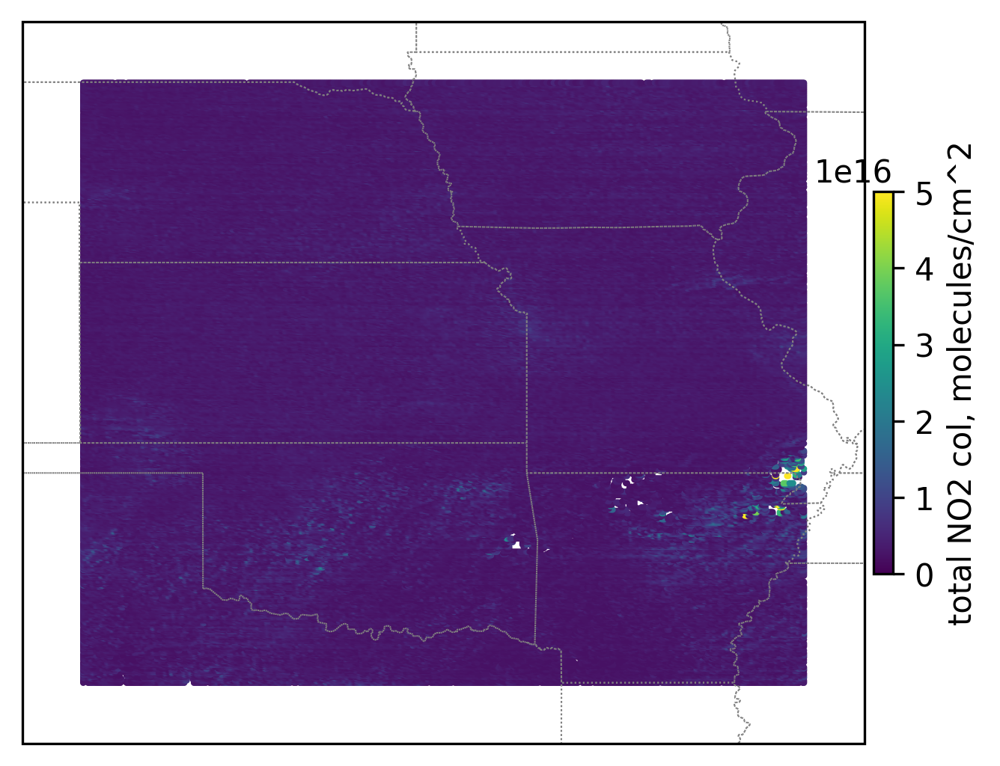

In [27]:
# Create a figure
fig = plt.figure(figsize=(5, 6), dpi=300, facecolor = None)

# Create a Cartopy projection
proj = ccrs.PlateCarree()
transform=ccrs.PlateCarree()

# Adding subplot
ax = fig.add_subplot(111, projection=proj)
# Add coastlines
ax.coastlines(linewidth=0.5)
# Add U.S. state borders
ax.add_feature(cfeature.STATES, linestyle=':', edgecolor='gray', linewidth=0.5)

im = ax.scatter(lon_loc_2D[best_data_mask_loc], lat_loc_2D[best_data_mask_loc], s=1\
              , c = trop_NO2_column_loc[best_data_mask_loc] + strat_NO2_column_loc[best_data_mask_loc]\
              , vmin = 0, vmax = 5.e+16, transform=transform)
ax.set_extent([-103, -89, 32, 44], crs=transform)

cb = plt.colorbar(im, ticks=[0, 1.e+16, 2.e+16, 3.e+16, 4.e+16, 5.e+16], fraction=0.022, pad=0.01)
cb.set_label('total NO2 col, '+NO2_unit, fontsize=10)

plt.show()

# 6. Another way to get the data - HarmonyPy

In [ ]:
print('Please provide your Earthdata Login credentials to allow data access')
print('Your credentials will only be passed to Earthdata and will not be exposed in the notebook')
username = input('Username:')

harmony_client = Client(env=Environment.PROD, auth=(username, getpass.getpass()))

### collection_ID is needed for this method
How do we get one?
Search for collection short name, TEMPO_NO2_L3, in EarthData https://search.earthdata.nasa.gov/search
and select right version, V03:
![img1](getting_collection_ID_1.jpg)
find collection_ID in the address line:
![img2](getting_collection_ID_2.jpg)

### getting specific datasets from a granule

In [29]:
granule_name = POI_results[8].data_links()[0].split('/')[-1]

# TEMPO Formaldehyde L3 C2930763263-LARC_CLOUD
request = Request(collection=Collection(id='C2930763263-LARC_CLOUD')\
                , granule_name=[granule_name]\
                , variables=['product/vertical_column_troposphere'\
                           , 'product/vertical_column_stratosphere'\
                           , 'product/main_data_quality_flag'\
                           , 'latitude', 'longitude'])

job_id = harmony_client.submit(request)
print(f'jobID = {job_id}')
harmony_client.wait_for_processing(job_id, show_progress=True)

# Download the resulting files
results = harmony_client.download_all(job_id, directory='.', overwrite=True)
all_results_stored = [f.result() for f in results]
print(f"Number of result files: {len(all_results_stored)}")

jobID = b7c09531-48eb-49cb-ad16-ee4c2d24a83b


 [ Processing: 100% ] |###################################################| [|]


./93667604_TEMPO_NO2_L3_V03_20240901T153815Z_S007_subsetted.nc4
Number of result files: 1
./93667613_TEMPO_NO2_L3_V03_20240901T105755Z_S001_subsetted.nc4
./93667612_TEMPO_NO2_L3_V03_20240901T003849Z_S017_subsetted.nc4
./93667611_TEMPO_NO2_L3_V03_20240831T235844Z_S016_subsetted.nc4
./93667614_TEMPO_NO2_L3_V03_20240901T113800Z_S002_subsetted.nc4
./93667615_TEMPO_NO2_L3_V03_20240901T121805Z_S003_subsetted.nc4
./93667616_TEMPO_NO2_L3_V03_20240901T125810Z_S004_subsetted.nc4
./93667617_TEMPO_NO2_L3_V03_20240901T133815Z_S005_subsetted.nc4
./93667619_TEMPO_NO2_L3_V03_20240901T153815Z_S007_subsetted.nc4
./93667618_TEMPO_NO2_L3_V03_20240901T143815Z_S006_subsetted.nc4
./93667620_TEMPO_NO2_L3_V03_20240901T163815Z_S008_subsetted.nc4
./93667621_TEMPO_NO2_L3_V03_20240901T173815Z_S009_subsetted.nc4
./93667623_TEMPO_NO2_L3_V03_20240901T193815Z_S011_subsetted.nc4
./93667624_TEMPO_NO2_L3_V03_20240901T203815Z_S012_subsetted.nc4
./93667622_TEMPO_NO2_L3_V03_20240901T183815Z_S010_subsetted.nc4
./93667625_TEM

### make sure we got the same numbers - read and test the subset

In [30]:
granule_name = all_results_stored[0]
lat, lon, strat_NO2_column, fv_strat_NO2, trop_NO2_column, fv_trop_NO2, NO2_unit, QF =\
read_TEMPO_NO2_L3(granule_name)

### How many pixels with valid column values and high quality flag?
there should be 7363186

In [31]:
good_data_mask = (QF == 0) & (trop_NO2_column != fv_trop_NO2) & (strat_NO2_column != fv_strat_NO2)
len(trop_NO2_column[good_data_mask])

7363186

### copy subset file - it will be over-written at the next step

In [32]:
for r in all_results_stored:
    print(r)
    ind = r.rfind('.')
    new_name = r[:ind]+'_variable_subset' + r[ind:]
    print(new_name)
    shutil.copy(r, new_name)

./93667604_TEMPO_NO2_L3_V03_20240901T153815Z_S007_subsetted.nc4
./93667604_TEMPO_NO2_L3_V03_20240901T153815Z_S007_subsetted_variable_subset.nc4


### spatial AND variable subset

In [33]:
request = Request(collection=Collection(id='C2930763263-LARC_CLOUD')\
                  # Note there is not a granule specified!
                , spatial=BBox(min_lon, min_lat, max_lon, max_lat)\
                , temporal={'start': dt.datetime(2024, 9, 1, 0, 0, 0)\
                          , 'stop': dt.datetime(2024, 9, 1, 23, 59, 59)}
                , variables=['product/vertical_column_troposphere'\
                           , 'product/vertical_column_stratosphere'\
                           , 'product/main_data_quality_flag'\
                           , 'latitude', 'longitude'])

job_id = harmony_client.submit(request)

print(f'jobID = {job_id}')
harmony_client.wait_for_processing(job_id, show_progress=True)

# Download the resulting files
results = harmony_client.download_all(job_id, directory='.', overwrite=True)
all_results_stored = sorted([f.result() for f in results])
print(f'Number of result files: {len(all_results_stored)}')

jobID = 6f739b39-7cee-4ad2-b19e-4f88e4e787b4


 [ Processing: 100% ] |###################################################| [|]


Number of result files: 18


### can the new subsetted granule be read by the our custom-made function read_TEMPO_NO2_L3(fn)?

In [34]:
granule_name = all_results_stored[8]
print(granule_name)
lat, lon, strat_NO2_column, fv_strat_NO2, trop_NO2_column, fv_trop_NO2, NO2_unit, QF =\
read_TEMPO_NO2_L3(granule_name)

./93667619_TEMPO_NO2_L3_V03_20240901T153815Z_S007_subsetted.nc4


### Yes, it can. But we can use another method to access netCDF files
using xarray library

In [35]:
# Open the data files
ds_dict = dict()
for r in all_results_stored:
  ds_root = xr.open_dataset(r)
  ds_product = xr.open_dataset(r, group='product')

  ds_dict[r] = xr.merge([ds_root, ds_product])

# 7. Plotting the data

### plotting individual images

0


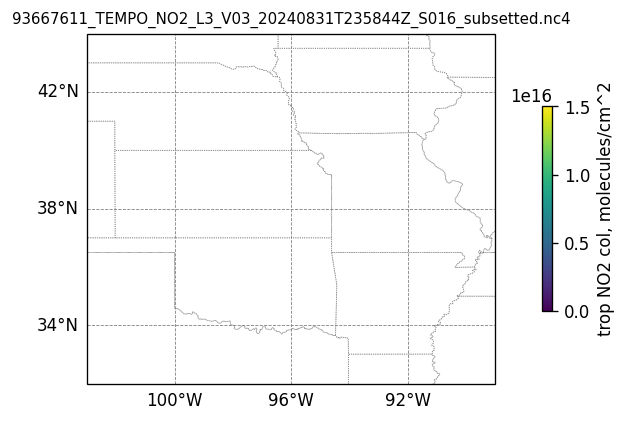

1


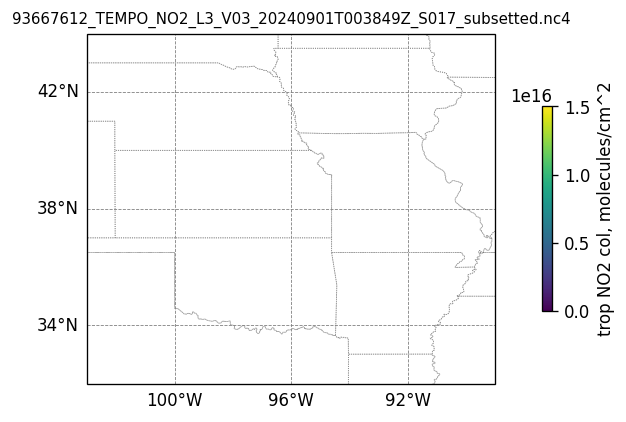

2


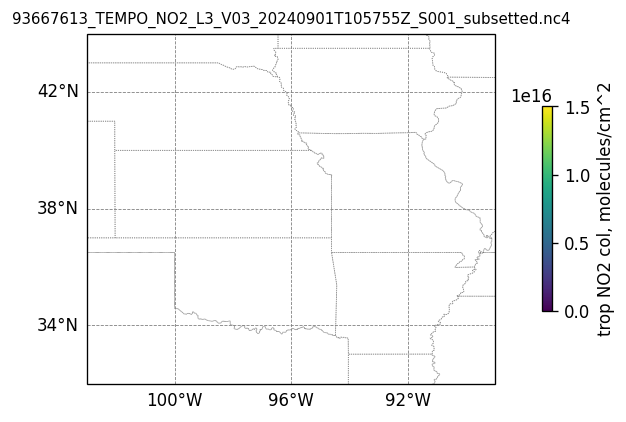

3


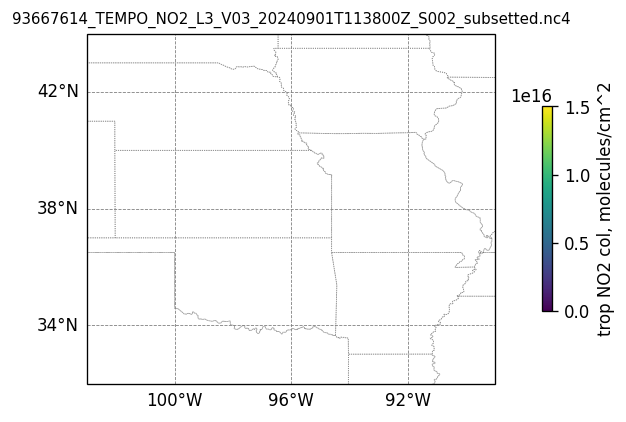

4


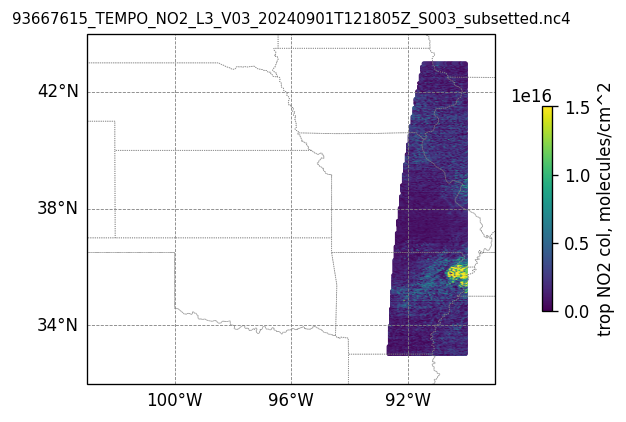

5


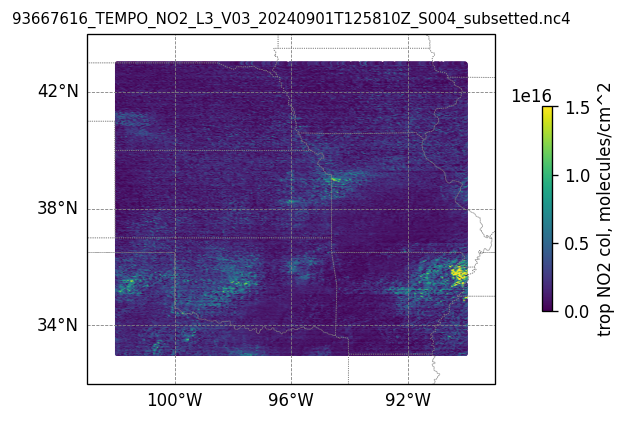

6


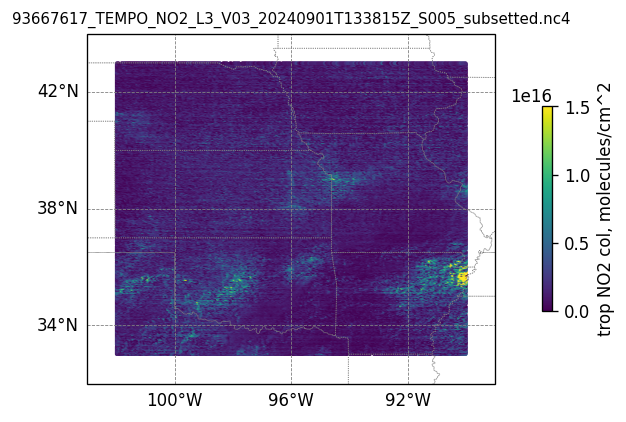

7


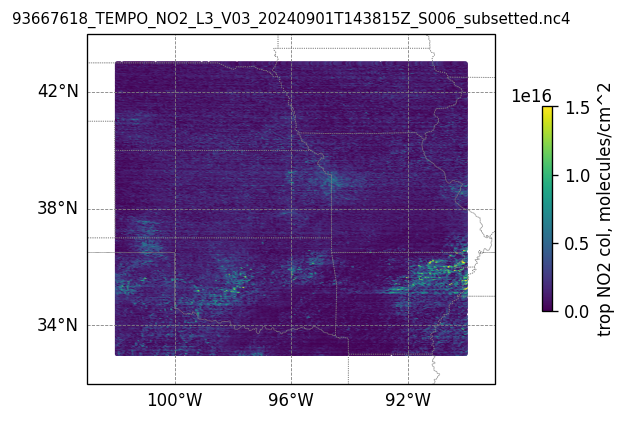

8


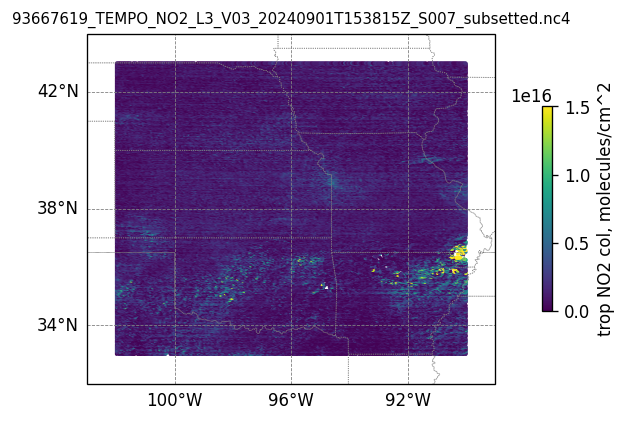

9


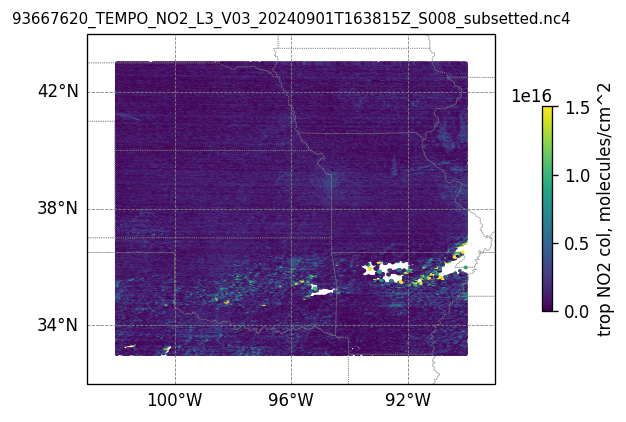

10


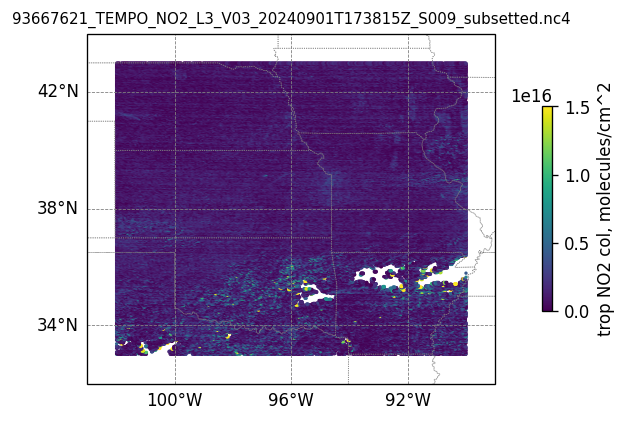

11


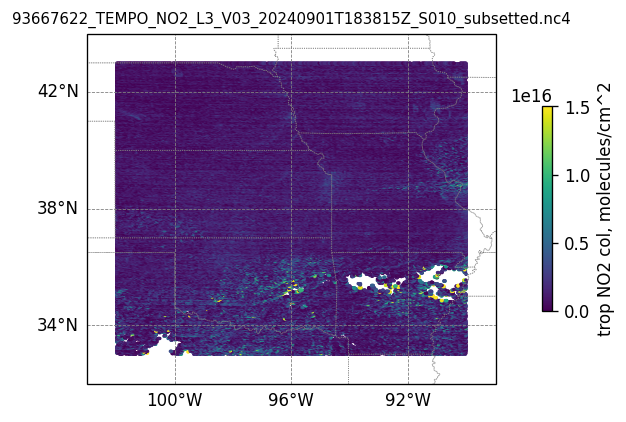

12


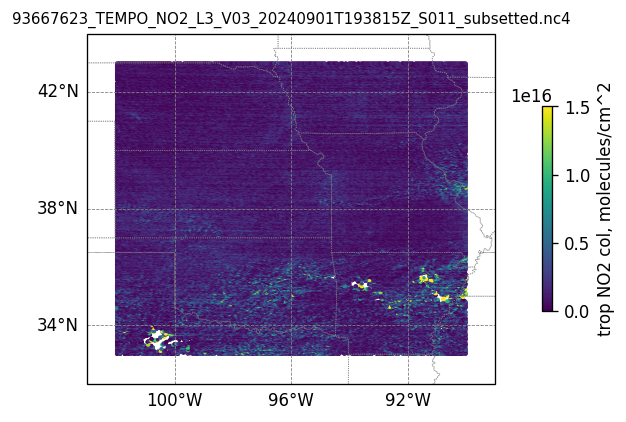

13


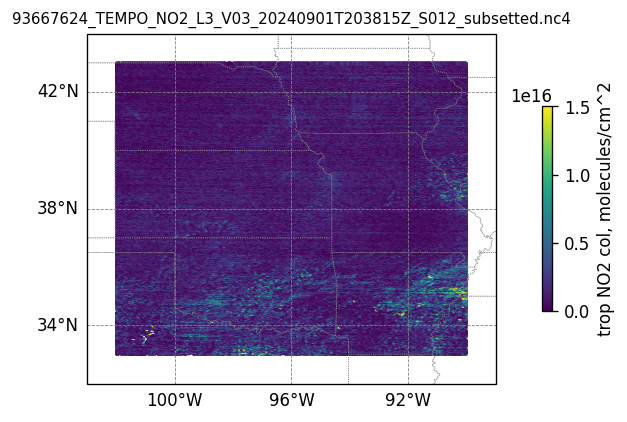

14


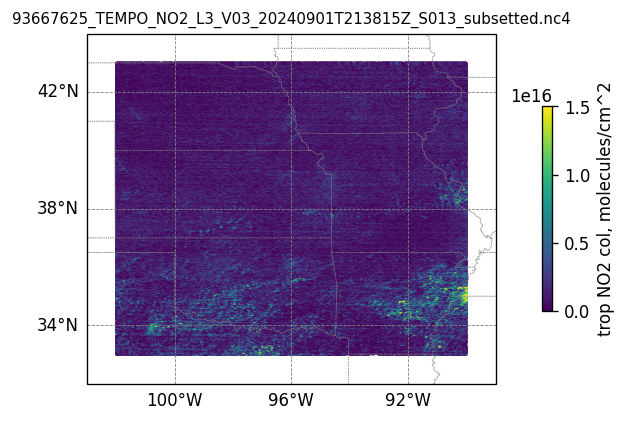

15


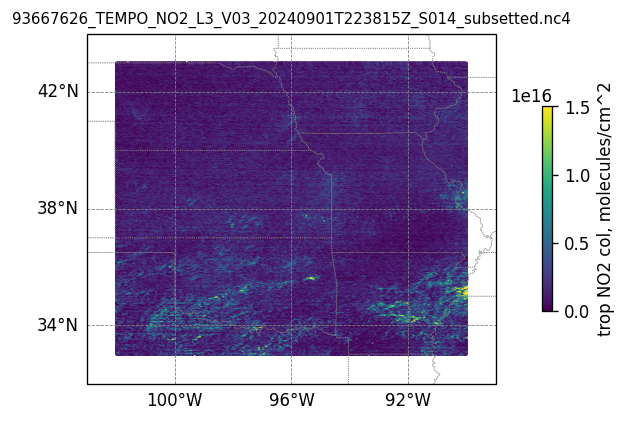

16


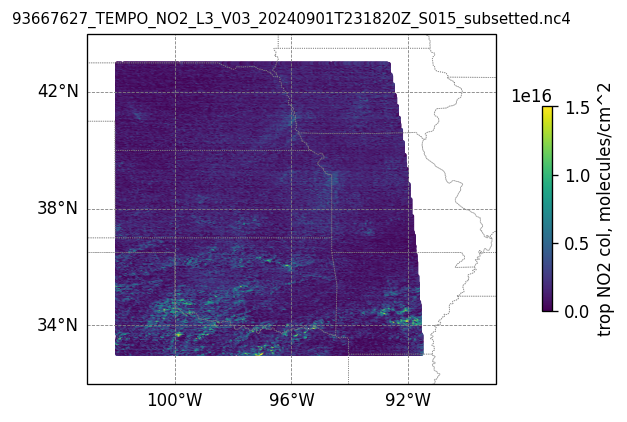

17


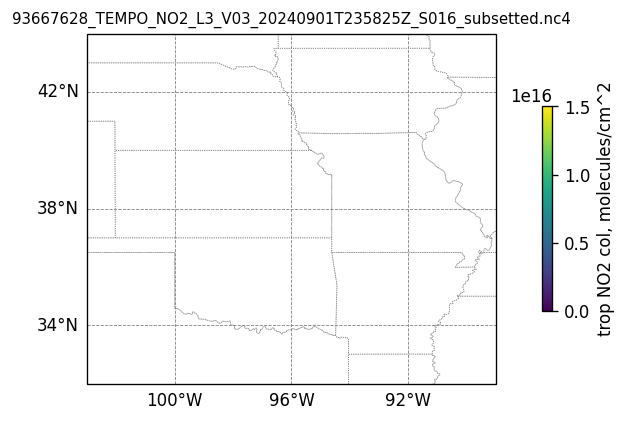

In [36]:
for i, (dk, dv) in enumerate(ds_dict.items()):
    Var = dv['vertical_column_troposphere'].values
    QF = dv['main_data_quality_flag'].values
    best_trop_NO2_mask = (Var > 0.) & (QF == 0)
    best_trop_NO2 = Var[best_trop_NO2_mask]

    (nt, nlat, nlon) = Var.shape
    lon_1D = dv['longitude'].values
    lon_2D = np.empty((nt, nlat, nlon))
    for j in range(nlat): lon_2D[0, j, :] = lon_1D
    lat_1D = dv['latitude'].values
    lat_2D = np.empty((nt, nlat, nlon))
    for j in range(nlon):lat_2D[0, :, j] = lat_1D
    print(i)

# Create a figure
    fig = plt.figure(figsize=(5, 6), dpi=120, facecolor = None)
# Create a Cartopy projection
    proj = ccrs.PlateCarree()
    transform=ccrs.PlateCarree()
# Adding subplot
    ax = fig.add_subplot(111, projection=proj)
# Add coastlines
    ax.coastlines(linewidth=0.5)
# Add U.S. state borders
    ax.add_feature(cfeature.STATES, linestyle=':', edgecolor='gray', linewidth=0.5)
# Set plot title, in this case - the name of subset granule
    ax.set_title(dk.split('/')[-1], fontsize=9)
# Set map extent
    ax.set_extent([-103, -89, 32, 44], crs=transform)
# Set gridlines
    gl = ax.gridlines(draw_labels=True, dms=True, color='gray', linestyle='--', linewidth=0.5)
    gl.xformatter = LONGITUDE_FORMATTER
    gl.yformatter = LATITUDE_FORMATTER
    gl.top_labels = False # no labels on the top margin
    gl.right_labels = False # no labels on the right margin
    gl.xlines = True
    gl.ylines = True
    gl.xlocator = mticker.FixedLocator([-100, -96, -92]) # longitude ticks
    gl.ylocator = mticker.FixedLocator([34, 38, 42]) # latitude ticks

    if len(best_trop_NO2) == 0:
      im = ax.scatter([POI_lon], [POI_lat], s=0\
                  , c = [0], vmin = 0, vmax = 1.5e+16, transform=transform)
    else:
      im = ax.scatter(lon_2D[best_trop_NO2_mask], lat_2D[best_trop_NO2_mask], s=1\
                    , c = best_trop_NO2, vmin = 0, vmax = 1.5e+16, transform=transform)

    cb = plt.colorbar(im, ticks=[0, .5e+16, 1.e+16, 1.5e+16], fraction=0.022, pad=0.1)
    cb.set_label('trop NO2 col, '+NO2_unit, fontsize=10)

    plt.show()

### plotting multi-panel image

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17


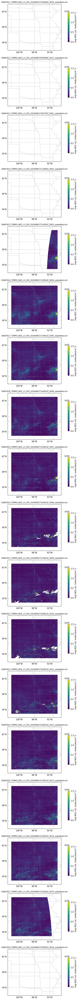

In [37]:
ngr = len(ds_dict)
# Create a figure
fig = plt.figure(figsize=(6, 5*ngr), dpi=120, facecolor = None)
# Create a Cartopy projection
proj = ccrs.PlateCarree()
transform=ccrs.PlateCarree()

for i, (dk, dv) in enumerate(ds_dict.items()):
    Var = dv['vertical_column_troposphere'].values
    QF = dv['main_data_quality_flag'].values
    best_trop_NO2_mask = (Var > 0.) & (QF == 0)
    best_trop_NO2 = Var[best_trop_NO2_mask]

    (nt, nlat, nlon) = Var.shape
    lon_1D = dv['longitude'].values
    lon_2D = np.empty((nt, nlat, nlon))
    for j in range(nlat): lon_2D[0, j, :] = lon_1D
    lat_1D = dv['latitude'].values
    lat_2D = np.empty((nt, nlat, nlon))
    for j in range(nlon):lat_2D[0, :, j] = lat_1D
    print(i)

# Adding subplot
    ax = fig.add_subplot(ngr, 1, i+1, projection=proj)
# Add coastlines
    ax.coastlines(linewidth=0.5)
# Add U.S. state borders
    ax.add_feature(cfeature.STATES, linestyle=':', edgecolor='gray', linewidth=0.5)
# Set plot title, in this case - the name of subset granule
    ax.set_title(dk.split('/')[-1], fontsize=9)
# Set map extent
    ax.set_extent([-103, -89, 32, 44], crs=transform)
# Set gridlines
    gl = ax.gridlines(draw_labels=True, dms=True, color='gray', linestyle='--', linewidth=0.5)
    gl.xformatter = LONGITUDE_FORMATTER
    gl.yformatter = LATITUDE_FORMATTER
    gl.top_labels = False # no labels on the top margin
    gl.right_labels = False # no labels on the right margin
    gl.xlines = True
    gl.ylines = True
    gl.xlocator = mticker.FixedLocator([-100, -96, -92]) # longitude ticks
    gl.ylocator = mticker.FixedLocator([34, 38, 42]) # latitude ticks

    if len(best_trop_NO2) == 0: # if there are no data points, ...
      im = ax.scatter([POI_lon], [POI_lat], s=0\
                    , c = [0], vmin = 0, vmax = 1.5e+16, transform=transform) # ... plot an empty image
    else:
      im = ax.scatter(lon_2D[best_trop_NO2_mask], lat_2D[best_trop_NO2_mask], s=1\
                    , c = best_trop_NO2, vmin = 0, vmax = 1.5e+16, transform=transform)

    cb = plt.colorbar(im, ticks=[0, .5e+16, 1.e+16, 1.5e+16], fraction=0.022, pad=0.1)
    cb.set_label('trop NO2 col, '+NO2_unit, fontsize=10)

plt.show()